# Capstone Project: Ted Talk View Count Prediction using Transcipts

**Data science process demonstrated:**
- Webscraping
- Regular Expression
- Natural Language Processing (Naive Bayes, Stemming, CounterVectorization, TfidfVectorizer, sentiment analysis, word cloud, venn diagram)
- Confusion Matrix
- Pipeline and Gridsearch
- Classification Modeling

## Content
- [Data Cleaning Transcript](#Data-Cleaning-Transcript)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
- [Sentiment Analysis](#Sentiment-Analysis)
- [Preprocessing](#Preprocessing)
- [Modeling](#Modeling)
- [Modeling Evaluation](#Modeling-Evaluation)

In [1]:
# imports

# for maths
import numpy as np
import pandas as pd

# Web scraping
import requests
from bs4 import BeautifulSoup

# nlp, cleaning
import regex as re
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer, PorterStemmer
import string # for punctuation removal
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
import nltk
from nltk.corpus import stopwords

# For visuals
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.style.use('seaborn')
%config InlineBackend.figure_format = 'retina'
import matplotlib_venn as venn2

# Preprocessing & Modeling
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from tabulate import tabulate
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score

# Sentiment analysis
from textblob import TextBlob

In [2]:
# import dataset
ted_talk = pd.read_csv('../dataset/TED_Talk.csv')

In [3]:
# Data Inspection
ted_talk.head()

,talk__id,talk__name,talk__description,view_count,comment_count,duration,transcript,video_type_name,event,number_of__speakers,...,related_talks,number_of__related_talks,intro_duration,ad_duration,post_ad_duration,external__duration,external__start_time,talks__player_talks__resources__h264__00__bitrate,talks__take_action,number_of__talks__take_actions
0,66,Do schools kill creativity?,Sir Ken Robinson makes an entertaining and pro...,65678748,4952.0,1164,Good morning. How are you?(Audience) Good.It's...,TED Stage Talk,TED2006,1,...,"[{'id': '865', 'hero': 'https://pe.tedcdn.com/...",6,11.82,3.33,0.83,1204.0,0.0,180.0,[],0
1,2405,This is what happens when you reply to spam email,"Suspicious emails: unclaimed insurance bonds, ...",59725446,288.0,588,"A few years ago, I got one of those spam email...",TED Stage Talk,TEDGlobal>Geneva,1,...,"[{'id': '2236', 'hero': 'https://pe.tedcdn.com...",6,11.82,3.33,0.83,589.0,0.0,180.0,[],0
2,1569,Your body language may shape who you are,(NOTE: Some of the findings presented in this ...,57734063,2649.0,1262,So I want to start by offering you a free no-t...,TED Stage Talk,TEDGlobal 2012,1,...,"[{'id': '1042', 'hero': 'https://pe.tedcdn.com...",6,11.82,3.33,0.83,1263.0,0.0,180.0,[],0
3,848,How great leaders inspire action,Simon Sinek has a simple but powerful model fo...,50494918,2093.0,1084,How do you explain when things don't go as we ...,TEDx Talk,TEDxPuget Sound,1,...,"[{'id': '1998', 'hero': 'https://pe.tedcdn.com...",6,11.82,3.33,0.83,1115.0,0.0,180.0,[],0
4,1042,The power of vulnerability,Brené Brown studies human connection -- our ab...,48503432,2234.0,1219,"So, I'll start with this: a couple years ago, ...",TEDx Talk,TEDxHouston,1,...,"[{'id': '1391', 'hero': 'https://s3.amazonaws....",6,11.82,3.33,0.83,1250.0,0.0,180.0,[],0


## Data Cleaning Transcript

**Display transcript null values**\
Randomly went through the null list, transcript not available at the ted talk homepage. Many transcripts are found available after googling online eg the famous ted talk from Steve Jobs. The searching process is tedious as some transcripts are in pdf, some are non english, some are animations, some are simply not available. I randomly select few to impute manually. I will also use this opportunity to demostrate simple webscraping. The rest of the rows with transcript NaNs will be dropped.

In [4]:
# check number of null count

print(f"There are {ted_talk.transcript.isnull().sum()} count of null values in transcript columns.")

There are 518 count of null values in transcript columns.


In [5]:
# transcript data type is object
ted_talk.transcript.dtypes

dtype('O')

In [6]:
# randomly went through the list, transcript not available at the ted talk homepage.
# Many transcripts are found available after googling online eg the famous ted talk from Steve Jobs.
# The searching process is tedious as some transcripts are in pdf, some are non english, some are animations, 
# some are simply not available

# I will impute manually for those that can be found online

# The rest of the rows with transcript NaNs will be dropped.

# display data
pd.options.display.max_rows = 4000
pd.options.display.max_columns = 500
pd.set_option('display.max_colwidth', None) # set full view to inspect text

ted_talk[(ted_talk.transcript.isnull())][['talk__name', 'transcript', 'speaker__name', 'view_count', 'recording_date']].head()

,talk__name,transcript,speaker__name,view_count,recording_date
99,How to live before you die,NaN,Steve Jobs,9556054,2005-06-12
196,Can you solve the counterfeit coin riddle?,NaN,Jennifer Lu,6397297,2017-01-03
337,Fracaso tras fracaso,NaN,Karla Souza,4604610,2015-03-21
368,"A dance of ""Symbiosis""",NaN,Pilobolus,4331459,2005-02-25
523,Watch me play ... the audience!,NaN,Bobby McFerrin,3406155,2009-06-10


**Create webscraping and impute function**

In [7]:
# create webscraping function to webscrap transcript searched online

def webscraping(url):
    # Establishing the connection to the web page:
    response = requests.get(url)
    # You can use status codes to understand how the target server responds to your request.
    # Ex., 200 = OK, 400 = Bad Request, 403 = Forbidden, 404 = Not Found.
    print(response.status_code)
    # It is forbidden. Hence, I have to resort to manually copy and paste since is only 1 transcript
    # Pull the HTML string out of requests and convert it to a Python string.
    html = response.text

    # The first 700 characters of the content.
    return html

In [8]:
# create impute function

def impute(row):
    ted_talk.at[row,'transcript']= soup
    return ted_talk.iloc[[row]][['talk__name', 'transcript', 'speaker__name', 'view_count', 'recording_date']]

**Webscrap to impute Row 99 Steve Jobs ted talk**

In [9]:
# webscrap for row 99 steve job 'How to live before you die'
webscraping("http://www.permondo.eu/how-to-live-before-you-die/")

200


'<!DOCTYPE html>\n<html lang="en-US">\n<head >\n<meta charset="UTF-8" />\n<meta name="viewport" content="width=device-width, initial-scale=1" />\n<title>How to live before you die – Steve Jobs</title>\n\n<link rel="stylesheet" href="http://www.permondo.eu/wp-content/plugins/sitepress-multilingual-cms/res/css/language-selector.css?v=3.1.5" type="text/css" media="all" />\n\n<!-- All In One SEO Pack 3.7.1[140,192] -->\n<meta name="description"  content="This article is a summary of the impressive speech given by Steve Jobs at Stanford University." />\n\n<script type="application/ld+json" class="aioseop-schema">{"@context":"https://schema.org","@graph":[{"@type":"Organization","@id":"http://www.permondo.eu/#organization","url":"http://www.permondo.eu/","name":"PerMondo","sameAs":[]},{"@type":"WebSite","@id":"http://www.permondo.eu/#website","url":"http://www.permondo.eu/","name":"PerMondo","publisher":{"@id":"http://www.permondo.eu/#organization"}},{"@type":"WebPage","@id":"http://www.perm

In [10]:
# create object
soup = BeautifulSoup(webscraping("http://www.permondo.eu/how-to-live-before-you-die/"), 'lxml')
soup = soup.find_all('p')[4:9]
# the number shown below is the request status code

200


In [11]:
# impute this text to steve job's ted talk in the data frame.
impute(99)
# Cleaning of text to be done later

,talk__name,transcript,speaker__name,view_count,recording_date
99,How to live before you die,"[[Today I want to tell you three stories about my life.], [The first is about connecting the dots. My biological mother, an unwed graduate student, put me up for adoption and she wanted me to grow up with parents who were graduates. It was all set for me to be adopted by a lawyer and his wife, but they decided they wanted a girl at the last minute and I ended up being adopted by another couple: my mother never graduated college and my father never graduated high school. , [], My biological mother refused to sign the adoption papers until my mother promised I would go to college. 17 years later, I dropped out of college not knowing what I wanted to do with my life and trusted that it would all work out ok. I now didn’t have to go to classes that were of no interest to me and dropped in on ones I did find interesting. It wasn’t easy, I had no dorm room and little money. But what I discovered through following my curiosity and intuition turned out to be priceless later on.], [The calligraphy class I dropped in on later inspired the beautiful fonts used when we designed the first MacKintosh computer. You can’t connect the dots looking forwards, you can only connect them looking backwards. You have to trust that the dots will somehow connect in your future, this will encourage you to follow your heart.], [My second story is about love and loss. I was lucky that I discovered what I loved doing and that Apple became such a huge success. It began in my garage when I was 20 and later became huge. I later got fired as someone I hired to run the company with me and I had different visions of the future. I lost what I loved most and I was devastated. But I realised I still loved doing it, so I started over and was free to be perhaps the most creative I have ever been in my life. During the next few years I founded a company named NeXT, a company named Pixar and fell in love with the woman who would become my wife. Remarkably, Apple bought next so I returned to Apple with the new technology we had created with NeXT. I also had a wonderful family with my wife. None of this would have happened if I hadn’t been fired from Apple. Even when life hits you hard, what really keeps you going is what you love. If you haven’t found it yet, keep looking, don’t settle. As with all matters of the heart, you’ll know when you’ve found it.], [My third story is about death. I read a quote once that said, live each day as if it were your last and someday you’ll be right. Knowing that I will be dead soon was the most important tool to help me make big choices in life. Fear of failure, embarrassment and pride all fall away in the face of death and only what is truly important remains. I was diagnosed with terminal pancreatic cancer, but was fortunate in that it turned out to be curable and I’m fine now. Death is the destination we all share. Although nobody wants to die, death is perhaps the most essential thing about life. It clears away the old and makes way for the new. Your time is limited so don’t waste it living someone else’s life, or be trapped by dogma which is being trapped by other people’s thinking. Have the courage to follow your heart and intuition, they somehow already know what you want to become. Stay hungry, stay foolish.]]",Steve Jobs,9556054,2005-06-12


**Webscrap to impute Row 976 Sir Ken Robinson ted talk**

In [12]:
# create object
soup = BeautifulSoup(webscraping("https://lifeistheteacher.wordpress.com/2011/01/25/changing-education-paradigms/"), 'lxml')
soup = soup.find_all('p')[3:15] # longer text
# impute this text to Sir Ken Robinson's ted talk in the data frame

200


In [13]:
# impute this text to row 976 Sir Ken Robinson's ted talk in the data frame.
impute(976)
# Cleaning of text to be done later

talk__name  \
976  Changing education paradigms   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

**Webscrap to impute Row 1756 Taika Waititi ted talk**

In [14]:
# create object
soup = BeautifulSoup(webscraping("https://singjupost.com/transcript-taika-waititi-on-the-art-of-creativity-at-tedxdoha/"), 'lxml')
soup = soup.find_all('p')[5:18]
# the number shown below is the request status code

200


In [15]:
# impute this text to Row 1756 Taika Waititi's ted talk in the data frame.
impute(1756)
# Cleaning of text to be done later

talk__name  \
1756  Why humor is key to creativity   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

**Webscrap to impute Row 3852 Jim Tamm ted talk**

In [16]:
# create object
soup = BeautifulSoup(webscraping("https://www.agilealliance.org/resources/videos/want-better-collaboration-dont-be-so-defensive/"), 'lxml')
soup = soup.find_all('p')[6:85]
# the number shown below is the request status code

200


In [17]:
# impute this text to Row 3852 Jim Tamm's ted talk in the data frame.
impute(3852)
# Cleaning of text to be done later

talk__name  \
3852  First step to collaboration? Don't be so defensive!   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

**Webscrap to impute Row 1682 Susan David ted talk**

In [18]:
# create object
soup = BeautifulSoup(webscraping("https://singjupost.com/how-to-be-your-best-self-in-times-of-crisis-susan-david-transcript/?singlepage=1"), 'lxml')
soup = soup.find_all('p')[4:105]
# the number shown below is the request status code

200


In [19]:
# impute this text to Row 3852 Jim Tamm's ted talk in the data frame.
impute(1682)
# Cleaning of text to be done later

talk__name  \
1682  How to be your best self in times of crisis   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

**Drop null values in transcript**

In [20]:
# drop remaining transcript null values as the process of seaching for transcript randomly online is very tedious
ted_talk.drop(ted_talk[(ted_talk.transcript.isnull())].index, inplace=True)

**Filter only transcript, talk__id and view count for analysis**

In [21]:
ted_talk[['transcript', 'view_count']].shape

(4096, 2)

In [22]:
ted_talk_transcript = ted_talk[['talk__id', 'transcript', 'view_count']]

**Clean view count outliers**

In [23]:
# view count = 0 is due to no view count monitoring at the ted talk home page
ted_talk_transcript[(ted_talk_transcript.view_count < 100)]['view_count']

4427    0
4440    0
4454    0
4472    0
4507    0
4527    0
4550    0
Name: view_count, dtype: int64

In [24]:
# drop view count = 0
ted_talk_transcript = ted_talk_transcript.copy()
ted_talk_transcript.drop([4427, 4440, 4454, 4472, 4507, 4527, 4550], axis = 0, inplace=True)

In [25]:
# confirmed there is no null values
ted_talk_transcript.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4089 entries, 0 to 4411
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   talk__id    4089 non-null   int64 
 1   transcript  4089 non-null   object
 2   view_count  4089 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 127.8+ KB


**Text Cleaning using Regex**

In [26]:
# convert transcript from object to trnscript for easy cleaning
ted_talk_transcript = ted_talk_transcript.copy()
ted_talk_transcript['transcript'] = ted_talk_transcript['transcript'].astype(str)

In [27]:
# import string punctuation for cleaning using regex before apply function
punctuation = string.punctuation
punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [28]:
# function to clean data using regex library
# remove special signs and punctuation marks

# function to clean text
def process_columns(col):
    # Remove words with 2 or fewer letters. Purposefully placed at the top to remove short words like i, me, do etc
    col = re.sub(r'\b\w{1,2}\b', '', col)
    
    # Remove emoji
    col = re.sub(r'[^\x00-\x7F]+', '', col)
    
    # Remove HTML special entities (e.g. &amp;)
    col = re.sub(r'\&\w*;', '', col)
    
    #Convert @username to AT_USER
    col = re.sub('@[^\s]+','',col)
    
    # Remove tickers
    col = re.sub(r'\$\w*', '', col)
    col = re.sub(r'\£\w*', '', col)
    
    # To lowercase
    col = col.lower()
    
    # Remove hyperlinks
    col = re.sub(r'https?:\/\/.*\/\w*', '', col)
    
    # Remove whitespace (including new line characters)
    col = re.sub(r'\s\s+', ' ', col)
    
    # Remove Punctuation and split 's, 't, 've with a space for filter
    col = re.sub(r'[' + punctuation.replace('@', '') + ']+', ' ', col)
    
    # remove Standalone numbers but keep numbers if it is integrated with words eg ps4, ps5, 2K21, 60Hz
    col = re.sub(r'\s*(?<!\B|-)\d+(?!\B|-)\s*', ' ', col)
    
    # remove quotes
    col = re.sub(r'[\"\',]', '', col)  
    
    # Remove single space remaining at the front of the text.
    col = col.lstrip(' ')

    
    return col

In [29]:
# apply regex cleaning function
ted_talk_transcript['transcript'] = ted_talk_transcript['transcript'].apply(process_columns)

In [30]:
# display transcript after cleaning
ted_talk_transcript.head(2)

talk__id  \
0        66   
1      2405   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

**Remove Stop words**

In [31]:
# import stop_words = english
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to C:\Users\Hong
[nltk_data]     Yee\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [32]:
print(stop_words)

{'ain', 'against', 'shouldn', "weren't", 'as', "mustn't", "wasn't", 'off', "should've", 'any', 'yours', 's', 'you', 'is', 'there', 'who', "didn't", "won't", "shan't", 'him', 'but', "doesn't", 'weren', 'what', 'by', 'than', 'about', 'whom', 'wouldn', 'being', 'in', 'how', 'm', "needn't", 'that', 'with', 'can', 'mightn', 'ourselves', 'do', "don't", 'up', 'an', 'below', 'been', 'his', 'shan', 'own', 'it', 'herself', 'not', 'once', 'such', "wouldn't", 'this', 'through', "you'll", 'doing', 'they', 'more', 'her', 'be', 'for', 'a', 'under', 'only', 'or', "you'd", 'most', 'between', 'same', 'if', 'will', 'further', 'until', 'hers', 'over', 'few', "hasn't", 'won', 'hasn', 'again', 'where', 'so', 'yourselves', "you've", 't', 'itself', 'couldn', 'each', 'ours', 'he', 'your', 'i', 'had', 'y', 'hadn', 'himself', 'out', "shouldn't", 'and', "that'll", 'are', 'having', 'didn', 'has', 'of', 'don', 'during', 'when', 'both', 'after', 'have', 'before', 'down', 'on', 'needn', 'these', 'should', "she's", 'j

In [33]:
# Additional sop words identified after first round of stop_words = 'english' removal.
# they are neutral words that doesnt make a difference
# remove “laughter”, “applause”, 'audience' and “music”, as these are words that appear frequently in the transcripts of TED Talks, 
# but refer to reactions from the audience or accompanying sounds to the speaker

additional_stopwords = {'tedx', 'ted', 'laughter', 'applause', 'music', 'audience', 'would', 'could', 'going', 'actually',\
                'get'}
stop_words = stop_words.union(additional_stopwords)

In [34]:
# apply stop_word = english removal to transcript column
ted_talk_transcript['transcript'] = ted_talk_transcript['transcript'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

**Identify blank transcript after stop words removal**

In [35]:
# Identify transcripts that were became blank after regex and stop words removal
ted_talk_transcript[(ted_talk_transcript.transcript == '')][['talk__id', 'transcript']]

,talk__id,transcript
816,2273,
1221,179,
1684,1464,
3015,2147,
3051,1156,


In [36]:
# row 676, 2366, 1677 has words but just remarks
ted_talk_transcript[(ted_talk_transcript['talk__id']==2684)| (ted_talk_transcript['talk__id']==2366)|\
                    (ted_talk_transcript['talk__id']==1677)]

,talk__id,transcript,view_count
676,2684,guitar starts cheers cheers ends,2854401
1844,2366,guitar starts ends distorted guitar starts ends ambient guitar starts ends,1518689
1999,1677,mechanical noises,1422827


In [37]:
# drop blank transcripts
ted_talk_transcript.drop([676, 816, 1221, 1684, 1844, 1999, 3015, 3051], axis = 0, inplace=True)

In [38]:
# Confirmed that all blank transcripts were dropped
ted_talk_transcript[(ted_talk_transcript.transcript == '')][['talk__id', 'transcript']]

,talk__id,transcript


In [39]:
# check the shape
ted_talk_transcript.shape

(4081, 3)

## Exploratory Data Analysis

Top words are positive words like 'one' 28376 counts, 'people' 28140 counts, 'like' 27577 counts, 'know' 17937 counts, 'think' 16334 counts.

In [40]:
# Top words from transcript using Countvectorization

cvec = CountVectorizer()
cvec.fit(ted_talk_transcript['transcript'])

len_features = len(cvec.get_feature_names())
print("Total number of feature length for ted talk words is:", len_features)

ted_150_cv = pd.DataFrame(cvec.transform(ted_talk_transcript['transcript']).todense(),columns=cvec.get_feature_names())

top_ted_150 = ted_150_cv.sum(axis=0)
top_ted_150 = top_ted_150.sort_values(ascending = False).head(150)
top_ted_150

Total number of feature length for ted talk words is: 68004


one            28376
people         28140
like           27577
know           17937
think          16334
see            15564
time           15274
really         14756
world          14317
way            12733
years          12105
things         11477
make           11403
want           11163
well           10912
right          10765
first          10598
even           10126
also           10103
two            10087
something       9791
new             9418
much            9358
work            9134
said            9086
many            9068
life            8894
need            8834
back            8661
look            8517
say             8270
thing           8213
take            8137
little          7994
every           7818
got             7814
around          7274
good            7187
lot             7061
different       7055
let             7048
day             6643
kind            6462
come            6247
use             6192
three           5952
year            5947
called       

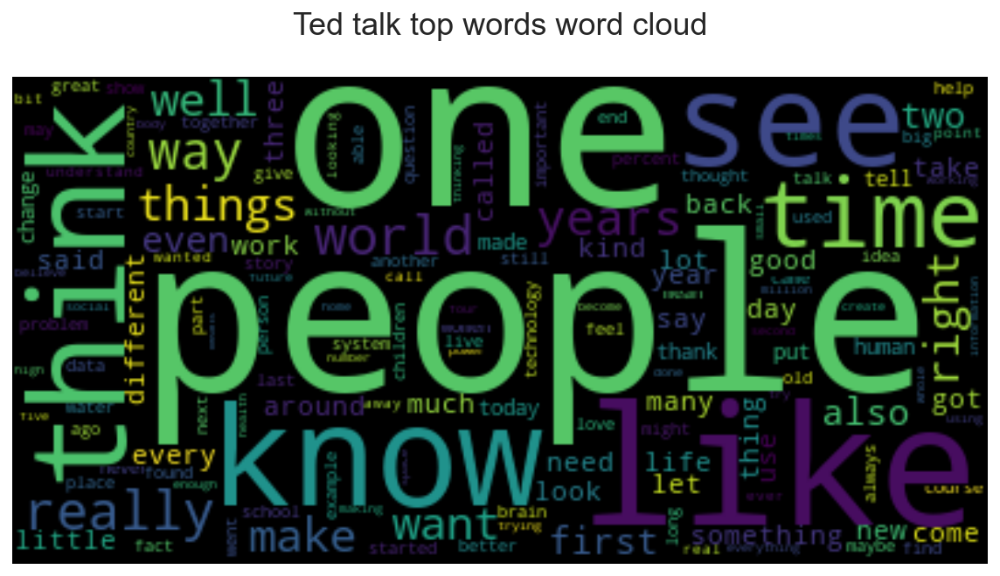

In [41]:
# wordcloud comparison for title

wc_tags = WordCloud(background_color="black", max_words=150, max_font_size=90, random_state=42)
wc_tags.generate_from_frequencies(top_ted_150)

fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (10, 10))

ax.imshow(wc_tags, interpolation="bilinear")
ax.axis("off")
ax.set_title('Ted talk top words word cloud', pad = 24, fontsize=18);

The word One is the most popular word across the corpus of all TED Transcripts which I think encapsulates the idea of TED pretty well. Like, See, One, People, Think and Know are among the most popular words used in TED Speeches. TED speeched seem to place a lot of emphasis on knowledge, insight and of course, the people. Some english stop words eg “Now” are positive that were thrown away. 'Would', 'could' are less representative of TED’s vision, hence were thrown away as stop words. 'applause', 'music', 'audience' are background sound in the transcript were also thrown away.

## Summary Statistics

Number of views is a Poisson like distribution skewed to the right, With a Median number of views: 1389637, and Mean (average) number of views: 2.175157e+06, maximum 65678748. Most of the view counts range from 0 to 4 million.

In [42]:
# apply describe()
ted_talk_transcript.describe().T

,count,mean,std,min,25%,50%,75%,max
talk__id,4081.0,1.333370e+04,1.848122e+04,1.0,1272.0,2380.0,23938.0,64548.0
view_count,4081.0,2.175157e+06,3.514401e+06,10124.0,887293.0,1389637.0,2159817.0,65678748.0


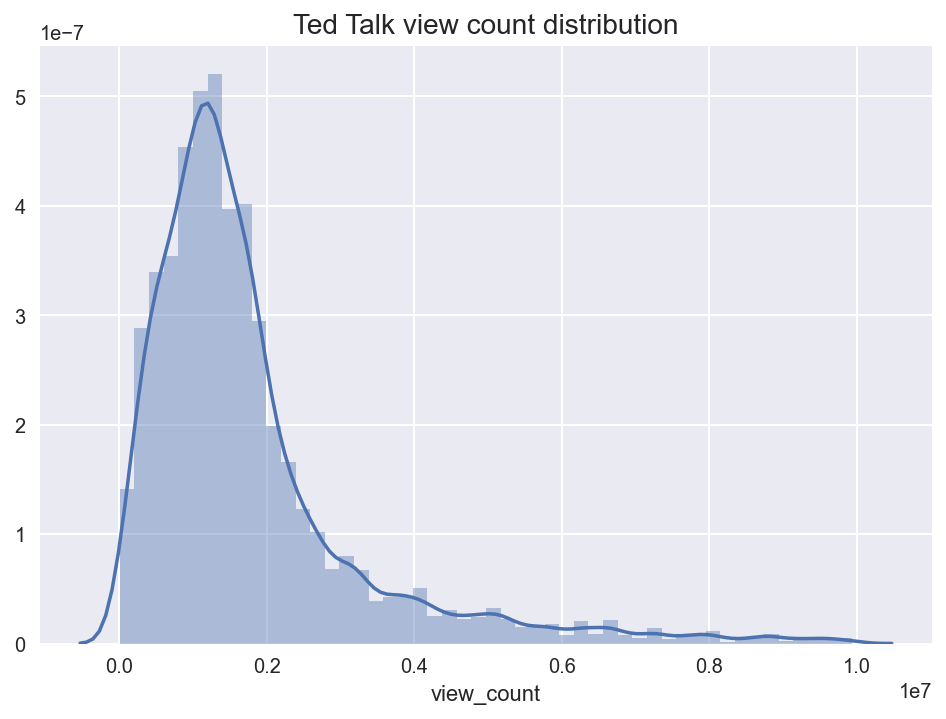

In [43]:
# plot distribution of view count
sns.distplot(ted_talk_transcript[ted_talk_transcript['view_count'] < 1e7]['view_count']).\
set_title('Ted Talk view count distribution', fontsize=14);

### Top words in popular(above median) and unpopular (below median) ted talks
In order to find out what are the top words that  differentiate popular and unpopular TED talks. I compare text in transcript for above median and below median. By comparing the extremes, I can gain insights on important words for view count predictions.

In [44]:
# create dataframe popular above median view counts
ted_talk_popular = ted_talk_transcript[(ted_talk_transcript.view_count >= 1389637)]

# create dataframe for unpopular ted talks, below median view counts
ted_talk_least = ted_talk_transcript[(ted_talk_transcript.view_count < 1389637)]

In [45]:
# apply stop words to talks with view counts or popular and unpopular class
ted_talk_popular = ted_talk_popular.copy()
ted_talk_least = ted_talk_least.copy()

ted_talk_popular['transcript'] = ted_talk_popular['transcript'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
ted_talk_least['transcript'] = ted_talk_least['transcript'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

In [46]:
# function to examine top 40 words in transcript

def top_30_words(transcript):
    cvec = CountVectorizer() # purposefully not to use stop_words here as it is already removed
    cvec.fit(transcript)

    ted_talk_cv = pd.DataFrame(cvec.transform(transcript).todense(),columns=cvec.get_feature_names())

    ted_talk_text = ted_talk_cv.sum(axis=0)
    ted_talk_text = ted_talk_text.sort_values(ascending = False).head(30)
    
    return ted_talk_text

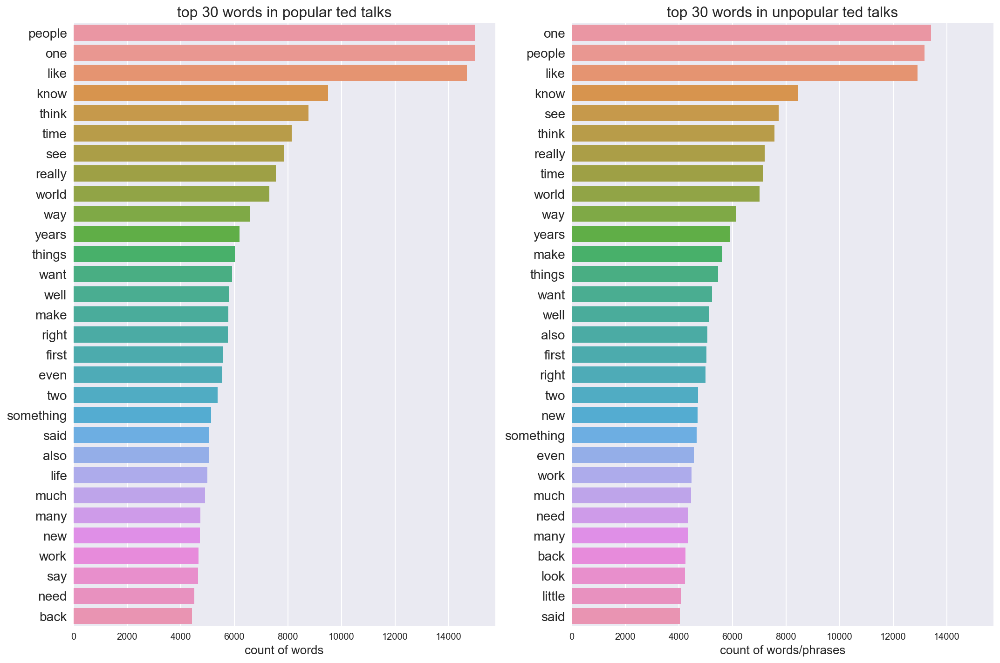

In [47]:
# plot results
fit, ax = plt.subplots(nrows = 1, ncols = 2, figsize=(15,10), sharex = True)

sns.barplot(y=top_30_words(ted_talk_popular['transcript']).index.values,\
            x = top_30_words(ted_talk_popular['transcript']),ax=ax[0])

ax[0].set_title('top 30 words in popular ted talks',fontsize=16)
ax[0].set_xlabel('count of words', fontsize=13)
plt.setp(ax[0].get_yticklabels(), fontsize=14)

sns.barplot(y=top_30_words(ted_talk_least['transcript']).index.values, \
            x = top_30_words(ted_talk_least['transcript']),ax=ax[1])

ax[1].set_title('top 30 words in unpopular ted talks',fontsize=16)
ax[1].set_xlabel('count of words/phrases', fontsize=13)
plt.setp(ax[1].get_yticklabels(), fontsize=14)

plt.tight_layout()

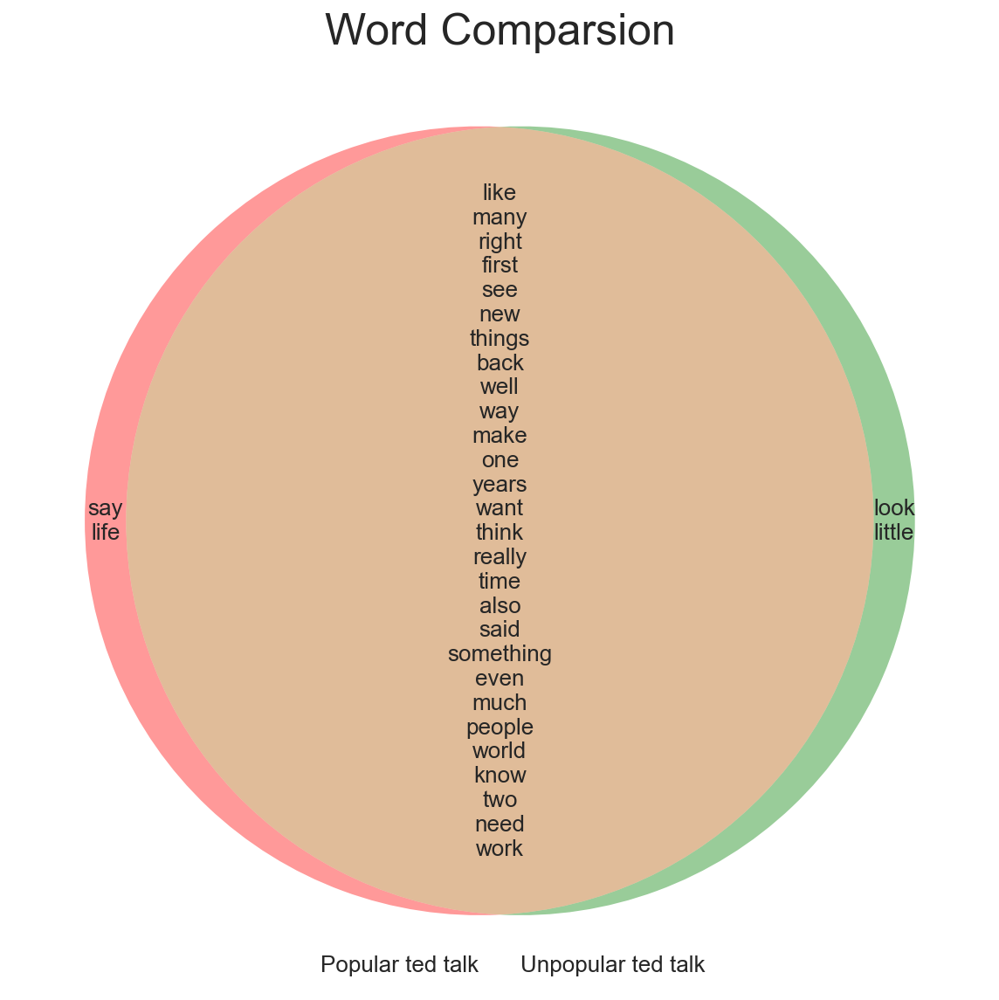

In [48]:
# identify unique words between popular and unpopular class
plt.figure(figsize=(10,10))

# Convert top words to set for drawing venn diagram
top_ted_30_pop = set(top_30_words(ted_talk_popular['transcript']).index)
top_ted_30_least = set(top_30_words(ted_talk_least['transcript']).index)

# title
plt.title('Word Comparsion',fontsize=25)

# plot venn diagram
v = venn2.venn2([top_ted_30_pop, top_ted_30_least], ('Popular ted talk', 'Unpopular ted talk'))

# set font size
for text in v.set_labels:
    text.set_fontsize(13)
for text in v.subset_labels:
    text.set_fontsize(13)

# labeling of words
v.get_label_by_id('100').set_text('\n'.join(top_ted_30_pop-top_ted_30_least))
v.get_label_by_id('110').set_text('\n'.join(top_ted_30_pop&top_ted_30_least))
v.get_label_by_id('010').set_text('\n'.join(top_ted_30_least-top_ted_30_pop))

There almost no unqiue words. This is actually inlined with TED vision - inspiring, focus in knowledge and people. There seem to be lots of commonalities between the popular and unpopular TED Talks - in the most frequent words used which leads me to believe that there are other factors that might be more important when determining the popularity of a talk - perhaps the speaker and their reputation or the topic of the talk. Will need to apply Tfidf for transcript ted talk view count prediction rather than applying multiple stop words

### Sentiment Analysis

Sentiment analysis (or opinion mining) uses natural language processing and machine learning to interpret and classify emotions in subjective data.

This section is to study the sentiments of the transcripts to see is there any way to detect uniqueness for view count prediction.

TextBlob, which is built on the shoulders of NLTK and Pattern. A big advantage of this is, it is easy to learn and offers a lot of features like sentiment analysis, pos-tagging, noun phrase extraction, etc. TextBlob is a python library and offers a simple API to access its methods and perform basic NLP tasks. 

In [49]:
#import nltk
nltk.downloader.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to C:\Users\Hong
[nltk_data]     Yee\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [50]:
pol = lambda x: TextBlob(x).sentiment.polarity
sub = lambda x: TextBlob(x).sentiment.subjectivity

In [51]:
# compute the sentiments of popular ted talks
ted_talk_popular['polarity'] = ted_talk_popular['transcript'].apply(pol)
ted_talk_popular['subjectivity'] = ted_talk_popular['transcript'].apply(sub)

# compute the sentiments of unpopular ted talks
ted_talk_least['polarity'] = ted_talk_least['transcript'].apply(pol)
ted_talk_least['subjectivity'] = ted_talk_least['transcript'].apply(sub)

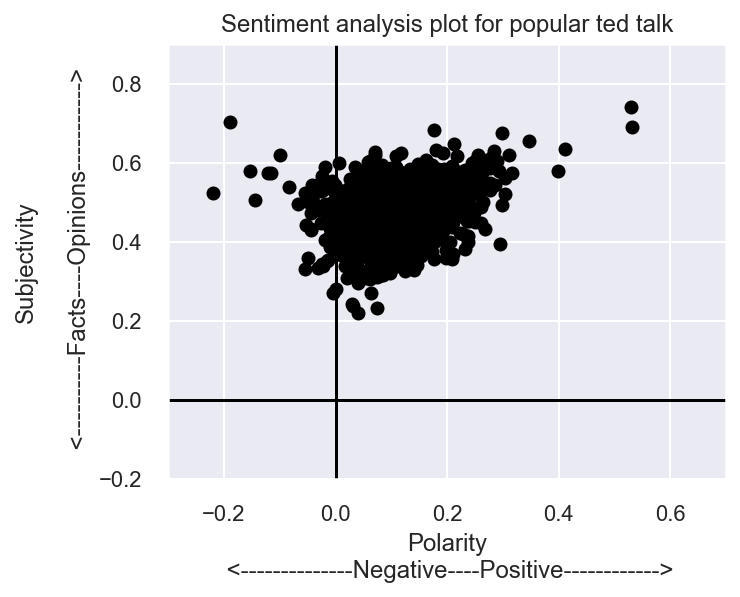

In [52]:
plt.rcParams['figure.figsize'] = [5,4]
sns.set(font_scale=1)
for index, talk in enumerate(ted_talk_popular.index):
    x = ted_talk_popular.polarity.loc[talk]
    y = ted_talk_popular.subjectivity.loc[talk]
    plt.scatter(x,y, color='black')
    plt.xlim(-.3, .7)
    plt.ylim(-.2, .9)
    plt.title("Sentiment analysis plot for popular ted talk")
    plt.ylabel("Subjectivity\n\n <----------Facts----Opinions----------->")
    plt.xlabel("Polarity\n <--------------Negative----Positive------------>")
    plt.axhline(0, color='black')
    plt.axvline(0, color='black')

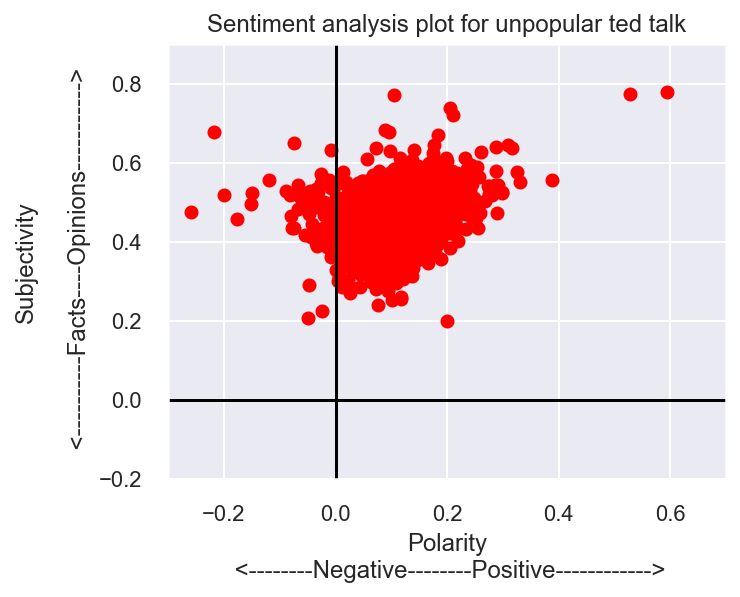

In [53]:
plt.rcParams['figure.figsize'] = [5,4]
sns.set(font_scale=1)
for index, talk in enumerate(ted_talk_least.index):
    x = ted_talk_least.polarity.loc[talk]
    y = ted_talk_least.subjectivity.loc[talk]
    plt.scatter(x,y, color='red')
    plt.xlim(-.3, .7)
    plt.ylim(-.2, .9)
    plt.title("Sentiment analysis plot for unpopular ted talk")
    plt.ylabel("Subjectivity\n\n <----------Facts----Opinions----------->")
    plt.xlabel("Polarity\n <--------Negative--------Positive------------>")
    plt.axhline(0, color='black')
    plt.axvline(0, color='black')

In general, both popular and unpopular ted talks are positive and opinionated. There is no difference of sentiments between popular and unpopular ted talks. This is in line with the general idea of TED talks as spreading ideas, optimism, and inspiration.

The unpopular ted talk sentiment seems more spreaded out. However, this was only due to a few data points

### Pairplot to observe any differences between sentiment of popular and unpopular ted talks
From the sentiment analysis, I did not see any potential that sentiments is able to differentiate the popular TED talk or the unpopular TED talk. However, i decided to extract the sentiments and apply it in my SelectKBest feature selection on my [TED talk view count prediction based on features](url) notebook. Since sentiments is numerical data, it will be good to let the feature selection to prove whether if sentiments is a good predictor or not.

In [54]:
# create classification column for popular and unpopular ted talks 
ted_talk_least['popular'] = 0
ted_talk_popular['popular'] = 1

In [55]:
# merge the 2 dataframe into 1 for pairplot
ted_talk_sentiment = pd.concat([ted_talk_least, ted_talk_popular], axis=0, sort=False)

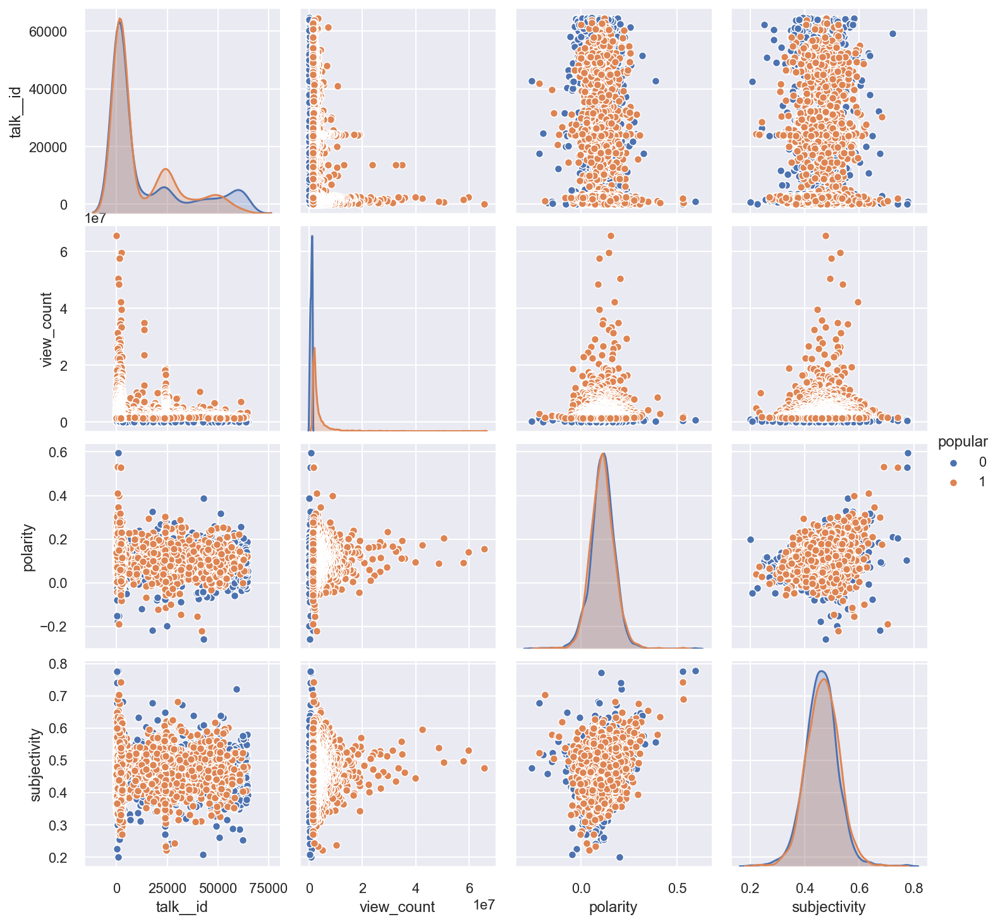

In [56]:
# run pairplot to have a quick understanding to see if there is any interesting co-relation
sns.pairplot(ted_talk_sentiment,kind ='scatter',diag_kind='kde',hue='popular');
# view count seems to be able to be differentiated for polarity and subjectivity

## Exploratory Data Analysis Summary

- Most common words appearing in Ted talks transcripts are 'one', 'people', 'like', 'know', 'think'. This align with the Ted talk's mission to be inspirational, people and knowledge focus
- Almost no words can differentiate the popular and unpopular ted talks. Commons words appeared in all Ted talks are positive and opinionated
- tfidf is needed to be applied to suppress/penalized Common words are penalized. Rare words have more influence.
- However, we see as polarity(positivity) and subjectivity(opinionated) increases, the higher the view count. This could be useful for our view count prediction

In [57]:
# Output: saving ted_talk sentiment analysis dataframe to csv
ted_talk_sentiment.to_csv('../dataset/ted_talk_sentiment.csv', index = False)

## Preprocessing

**Additional stop words removal**\
I tried removing more overlapping stopwords. However, the accuracy score did not improved, and there is more overfitting. Hence I have deleted this step away.

The preprocessing for the transcript will be only stemming. Stemming is the process of reducing a word to its word stem that affixes to suffixes and prefixes or to the roots of words known as a lemma. Stemming is important in natural language understanding (NLU) and natural language processing (NLP).

**Stemming**\
Stemming is a part of linguistic studies in morphology and artificial intelligence (AI) information retrieval and extraction. Stemming and AI knowledge extract meaningful information from vast sources like big data or the Internet since additional forms of a word related to a subject may need to be searched to get the best results. Stemming is also a part of queries and Internet search engines.

Recognizing, searching and retrieving more forms of words returns more results. When a form of a word is recognized it can make it possible to return search results that otherwise might have been missed. That additional information retrieved is why stemming is integral to search queries and information retrieval.

In [58]:
# import port stemmer
porter_stemmer = PorterStemmer()

def stem_sentences(sentence):
    tokens = sentence.split()
    stemmed_tokens = [porter_stemmer.stem(token) for token in tokens]
    return ' '.join(stemmed_tokens)

In [59]:
# display dataframe
ted_talk_sentiment.sort_index().head()

talk__id  \
0        66   
1      2405   
2      1569   
3       848   
4      1042   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

In [60]:
# Apply stemming
ted_talk_sentiment = ted_talk_sentiment.copy()
ted_talk_sentiment['transcript'] = ted_talk_sentiment['transcript'].apply(stem_sentences)

In [61]:
# drop redundant columns
ted_talk_sentiment.drop(['talk__id', 'view_count'], axis=1, inplace=True)

In [62]:
# sort values
ted_talk_sentiment.sort_index()
# stemming observed as words were shorten

transcript  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           good morn good great blown away whole thing fact leav three theme run confer relev want talk one extraordinari evid human creativ present peopl varieti rang second put place idea happen term futur idea may play interest educ find everybodi interest educ find interest dinner parti say work educ often dinner parti frankli work educ ask never ask back curious strang say somebodi know say say work educ see blood run face like god one night week ask educ pin wall one thing goe deep peopl right like religion money thing big interest educ think huge vest interest partli educ meant take futur grasp think children start school year retir nobodi clue despit expertis parad past four day world look like five year time yet meant educ unpredict think extraordinari third part agre nonetheless realli extraordinari capac children capac innov mean sirena last night marvel see except think speak except whole childhood person extraordinari dedic found talent content kid tremend talent squander pretti ruthlessli want talk educ want talk creativ content creativ import educ literaci treat statu thank way thank much minut left well born heard great stori recent love tell littl girl draw lesson six back draw teacher said girl hardli ever paid attent draw lesson teacher fascin went said draw girl said draw pictur god teacher said nobodi know god look like girl said minut son four england four everywher honest strict wherev went four year nativ play rememb stori big big stori mel gibson sequel may seen nativ jame got part joseph thrill consid one lead part place cram full agent shirt jame robinson joseph speak know bit three king come come bear gift gold frankincens myrrh realli happen sit think went sequenc talk littl boy afterward said said yeah wrong switch three boy came four year old tea towel head put box first boy said bring gold second boy said bring myrrh third boy said frank sent thing common kid take chanc know right frighten wrong mean say wrong thing creativ know prepar wrong never come anyth origin prepar wrong time adult kid lost capac becom frighten wrong run compani like stigmat mistak run nation educ system mistak worst thing make result educ peopl creativ capac picasso said said children born artist problem remain artist grow believ passion grow creativ grow rather educ live stratford avon five year ago fact move stratford lo angel imagin seamless transit live place call snitterfield outsid stratford shakespear father born struck new thought think shakespear father think shakespear child shakespear seven never thought mean seven point somebodi english class annoy must tri harder sent bed dad shakespear bed william shakespear put pencil stop speak like confus everybodi anyway move stratford lo angel want say word transit son want come got two kid daughter want come lo angel love girlfriend england love life sara

In [63]:
# check any null values
ted_talk_sentiment.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4081 entries, 2057 to 2056
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   transcript    4081 non-null   object 
 1   polarity      4081 non-null   float64
 2   subjectivity  4081 non-null   float64
 3   popular       4081 non-null   int64  
dtypes: float64(2), int64(1), object(1)
memory usage: 159.4+ KB


### Create Feature Matrix

3 sets of data is need to be created.

1) training set to train all models (60% of the data available)\
2) test set to check for accuracy after each modeling (20% of the data available)\
3) test best model selected using an unseen data to confirm performance (20% of the data available)

In [64]:
# define X & y
X = ted_talk_sentiment['transcript']
y = ted_talk_sentiment['popular']

In [65]:
# Create 3 sets of data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, stratify=y)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1, stratify=y_train) # 0.25 x 0.8 = 0.2

## Modeling

The modeling results is expected to be very poor as based on EDA, I already can observed that there is very few words can differentiate the popular and unpopular TED talks.

I ran a few models eg Support Vector Classifier, RandomForest, Gradient Descent, Logistic Regression, Naive Bayes etc and pipeline overnight with tfidf and countvectorizer to run. Support Vector Classifier, RandomForest, Gradient Descent, gave 55% to 61% accuracy test score and 95% to 100% on train score. This is clearly heavy overfitting. To save time, I deleted underperforming models and create 2 by 2 models for the better performing (lower overfit) Logistic Regression vs Naive Bayes.

Hypertuning by create 2 by 2 models:

1) 2 classification models - Logistic Regression vs Naive Bayes

Apply tfidf and countvectorizer:\
TfidfVectorizer: Common words are penalized. Rare words have more influence as compared to countvectorizer.\
Countvectorization will take take non-duplicated words as its vocabulary a.k.a the feature

#### Steps taken:
1) Obtain a baseline score\
2) Modeling using pipeline Naive Bayes with TfidfVectorizer.\
3) Modeling using pipeline Naive Bayes with CountVectorizer\
4) Modeling using pipeline Logistic Regression Modeling with TfidfVectorizer\
5) Modeling using pipeline Logistic Regression Modeling with CountVectorizer

- Train each model on training dataset (X_train, y_train dataset).
- Test each model on test dataset (X_test, y_test dataset).
- Test best model using unseen dataset (X_val, y_val dataset).
- Analyze confusion matrix for all models and obtain accuracy, sensitivity, specificity, precision for comparison.

### Zero Rule Algorithm to obtain baseline
ZeroR is the simplest classification method which relies on the target and ignores all predictors. ZeroR classifier simply predicts the majority category (class). Although there is no predictability power in ZeroR, it is useful for determining a baseline performance as a benchmark for classification methods.

In [66]:
print("Accuracy of the baseline using Zero Rule Algorithm is") 
y_test.value_counts(normalize=True)

Accuracy of the baseline using Zero Rule Algorithm is


1    0.500612
0    0.499388
Name: popular, dtype: float64

In [67]:
print(X_train.shape) # X_train, y_train will be used to train my models (60%)
print(y_train.shape)

print(X_test.shape) # X_test, y_test will be used to test the models (20%)
print(y_test.shape)

print(X_val.shape) # X_val, y_val will be used as unseen data to test the final selected model (20%)
print(y_val.shape)

(2448,)
(2448,)
(817,)
(817,)
(816,)
(816,)


### Modeling by Pipeline Naive Bayes with TfidfVectorizer

In [68]:
%%time
pipe_nb_tf = Pipeline([
    ('tf', TfidfVectorizer()),
    ('nb', MultinomialNB())
])

params_nb_tf = {
    'tf__max_features': [1000, 2000, 3000, 4000, 5000], 
    'tf__ngram_range':  [(1, 1), (1, 2), (1, 3)],
}

gs_nb_tf = GridSearchCV(pipe_nb_tf, 
                        param_grid=params_nb_tf,
                        cv=5,
                        n_jobs=2,
                        verbose=1)
    
gs_nb_tf.fit(X_train, y_train)

print(f'GridSearch Best Params:{gs_nb_tf.best_params_}')
print('Train Score:', gs_nb_tf.score(X_train, y_train))
print('Test Score:', gs_nb_tf.score(X_test, y_test))

Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  3.2min
[Parallel(n_jobs=2)]: Done  75 out of  75 | elapsed:  5.4min finished


GridSearch Best Params:{'tf__max_features': 3000, 'tf__ngram_range': (1, 1)}
Train Score: 0.7549019607843137
Test Score: 0.6266829865361077
Wall time: 5min 30s


In [69]:
# Confusion matrix parameters function 

def conf_matrix(model, X_test, y_test):
    y_hat = model.predict(X_test) 
    # get confusion matrix data
    cm = confusion_matrix(y_test, y_hat)  
    # extract elements of confusion matrix
    tn, fp, fn, tp = cm.ravel()        
    
    # Convert Confusion Matrix to DataFrame
    df_cm = pd.DataFrame(cm, columns=['pred negative', 'pred positive'], index=['actual_negative', 'actual positive'])
    return df_cm
    
def conf_matrix_metrics(model, X_test, y_test):
    y_hat = model.predict(X_test) 
    cm = confusion_matrix(y_test, y_hat)  
    tn, fp, fn, tp = cm.ravel()           
    
    #calculate metrics 
    accuracy = (tp + tn) / (tn + fp + fn + tp)
    sensitivity = tp / (tp + fn)
    specificity = tn/ (tn + fp)
    precision = tp /(tp + fp)
    
    return {'accuracy': np.round(accuracy,3),
            'sensitivity': np.round(sensitivity,3),
            'specificity': np.round(specificity,3),
            'precision': np.round(precision,3)}

In [70]:
# print confusion matrix
print(conf_matrix(gs_nb_tf, X_test, y_test))
conf_matrix_metrics(gs_nb_tf, X_test, y_test)

                 pred negative  pred positive
actual_negative            237            171
actual positive            134            275


{'accuracy': 0.627,
 'sensitivity': 0.672,
 'specificity': 0.581,
 'precision': 0.617}

### Modeling by Pipeline Naive Bayes with CountVectorizer

In [71]:
%%time
pipe_nb_cvec = Pipeline([
    ('cvec', CountVectorizer()),
    ('nb', MultinomialNB())
])

params_nb_cvec = {
    'cvec__max_features': [100, 500, 1000, 2000, 3000, 4000, 5000], 
    'cvec__ngram_range':[(1, 1), (1, 2), (1, 3)],
    'cvec__min_df': [2, 3],
    'cvec__max_df': [.9, .95],
}

gs_nb_cvec = GridSearchCV(pipe_nb_cvec, 
                        param_grid=params_nb_cvec,
                        cv=5,
                        n_jobs=2,
                        verbose=1)
    
gs_nb_cvec.fit(X_train, y_train)

print(f'GridSearch Best Params:{gs_nb_cvec.best_params_}')
print('Train Score:', gs_nb_cvec.score(X_train, y_train))
print('Test Score:', gs_nb_cvec.score(X_test, y_test))

Fitting 5 folds for each of 84 candidates, totalling 420 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  3.3min
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed: 14.2min
[Parallel(n_jobs=2)]: Done 420 out of 420 | elapsed: 30.5min finished


GridSearch Best Params:{'cvec__max_df': 0.9, 'cvec__max_features': 5000, 'cvec__min_df': 3, 'cvec__ngram_range': (1, 2)}
Train Score: 0.7508169934640523
Test Score: 0.6132190942472461
Wall time: 30min 39s


In [72]:
print(conf_matrix(gs_nb_cvec, X_test, y_test))
conf_matrix_metrics(gs_nb_cvec, X_test, y_test)

                 pred negative  pred positive
actual_negative            239            169
actual positive            147            262


{'accuracy': 0.613,
 'sensitivity': 0.641,
 'specificity': 0.586,
 'precision': 0.608}

### Modeling by Pipeline Logistic Regression Modeling with TfidfVectorizer

In [73]:
%%time
pipe_lr_tf = Pipeline([
    ('tf', TfidfVectorizer()),
    ('lr', LogisticRegression())
])

params_lr_tf = {
    'tf__max_features': [1000, 2000, 3000, 4000], 
    'tf__ngram_range':  [(1, 1), (1, 2), (1, 3)], 
    'lr__penalty':      ['l2', 'l1'],
    'lr__C':            [.5, .01, 1],
    'lr__random_state': [42] 
}
gs_lr_tf = GridSearchCV(pipe_lr_tf, 
                        param_grid=params_lr_tf,
                        cv=5,
                        n_jobs=2,
                        verbose=1)

gs_lr_tf.fit(X_train, y_train)

print(f'GridSearch Best Params: {gs_lr_tf.best_params_}')
print('Train Score:', gs_lr_tf.score(X_train, y_train))
print('Test Score:', gs_lr_tf.score(X_test, y_test))

Fitting 5 folds for each of 72 candidates, totalling 360 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  3.2min
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed: 13.4min
[Parallel(n_jobs=2)]: Done 360 out of 360 | elapsed: 24.7min finished


GridSearch Best Params: {'lr__C': 0.5, 'lr__penalty': 'l2', 'lr__random_state': 42, 'tf__max_features': 3000, 'tf__ngram_range': (1, 1)}
Train Score: 0.7879901960784313
Test Score: 0.627906976744186
Wall time: 24min 48s


In [74]:
print(conf_matrix(gs_lr_tf, X_test, y_test))
conf_matrix_metrics(gs_lr_tf, X_test, y_test)

                 pred negative  pred positive
actual_negative            260            148
actual positive            156            253


{'accuracy': 0.628,
 'sensitivity': 0.619,
 'specificity': 0.637,
 'precision': 0.631}

### Modeling by Pipeline Logistic Regression Modeling with Countvectorizer

In [75]:
%%time
pipe_lr_cvec = Pipeline([
    ('cvec', CountVectorizer()),
    ('lr', LogisticRegression())
])

params_lr_cvec = {
    'cvec__stop_words': [None, 'english'],
    'cvec__max_features': [5000], 
    'cvec__ngram_range':[(1, 1)],
    'cvec__min_df': [2, 3],
    'cvec__max_df': [.9, .95],
    'lr__penalty':      ['l2'],
    'lr__C':            [.01],
    'lr__random_state': [42] 
}
gs_lr_cvec = GridSearchCV(pipe_lr_cvec, 
                        param_grid=params_lr_cvec,
                        cv=5,
                        n_jobs=2,
                        verbose=1)

gs_lr_cvec.fit(X_train, y_train)

print(f'GridSearch Best Params: {gs_lr_cvec.best_params_}')
print('Train Score:', gs_lr_cvec.score(X_train, y_train))
print('Test Score:', gs_lr_cvec.score(X_test, y_test))

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  40 out of  40 | elapsed:  1.3min finished
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


GridSearch Best Params: {'cvec__max_df': 0.95, 'cvec__max_features': 5000, 'cvec__min_df': 3, 'cvec__ngram_range': (1, 1), 'cvec__stop_words': None, 'lr__C': 0.01, 'lr__penalty': 'l2', 'lr__random_state': 42}
Train Score: 0.9771241830065359
Test Score: 0.6009791921664627
Wall time: 1min 23s


In [76]:
print(conf_matrix(gs_lr_cvec, X_test, y_test))
conf_matrix_metrics(gs_lr_cvec, X_test, y_test)

                 pred negative  pred positive
actual_negative            247            161
actual positive            165            244


{'accuracy': 0.601,
 'sensitivity': 0.597,
 'specificity': 0.605,
 'precision': 0.602}

### Summary of models performance

All the models are underperforming on test data. The reason is because Grid Search gets the best performing model on train set, hence when applied on test set data, it will under perform.

All the models on training set achieved minimum 0.98 and test score achieved minimum 0.601.\
All the models showed at least 1.2x better accuracy score than the baseline.
The poor performance is due to large number of common words between the popular and unpopular TED talk classification. The words in all the talks used are very similar. They aligned with TED vision - inspiring, focus in knowledge and people.

For Naive Bayes + TF-IDF it achieved 0.755 and 0.627 on test data, the differential is 0.128\
For Naive Bayes + CVEC it achieved 0.751 and 0.613 on test data, the differential is 0.138\
For LR + TF-IDF it achieved 0.788 on train and 0.628 on test data, the differential is 0.16\
For LR + CVEC it achieved 0.977 on train and 0.601 on test data, the differential is 0.376


Hence the best model is Naive Bayes model with CounterVectorizer because the train and test score is closest to each other. We can predict with an accuracy of about 60.8% whether a given talk is popular or unpopular.



|            Dataset            |                                          Naive Bayes + Tfidf                                          |                                           Naive Bayes + CVEC                                          |                                      Logistic Regression + Tfidf                                      |                                       Logistic Regression + CVEC                                      |
|:-----------------------------:|:-----------------------------------------------------------------------------------------------------:|:-----------------------------------------------------------------------------------------------------:|:-----------------------------------------------------------------------------------------------------:|:-----------------------------------------------------------------------------------------------------:|
|             Train             |                                                 0.755                                                 |                                                 0.751                                                 |                                                 0.788                                                 |                                                 0.977                                                 |
|              Test             |                                                 0.627                                                 |                                                 0.613                                                 |                                                 0.628                                                 |                                                 0.601                                                 |
|       Confusion   Matrix      | True Negative: 237<br>     False Negative: 134<br>     False Positive: 171<br>     True Positive: 275 | True Negative: 239<br>     False Negative: 147<br>     False Positive: 169<br>     True Positive: 262 | True Negative: 260<br>     False Negative: 156<br>     False Positive: 148<br>     True Positive: 253 | True Negative: 247<br>     False Negative: 165<br>     False Positive: 161<br>     True Positive: 244 |
| Confusion   Matrix Parameters |     accuracy: 0.627<br>     sensitivity: 0.672<br>     specificity: 0.581<br>     precision: 0.617    |     accuracy: 0.613<br>     sensitivity: 0.541<br>     specificity: 0.586<br>     precision: 0.608    |     accuracy: 0.628<br>     sensitivity: 0.619<br>     specificity: 0.637<br>     precision: 0.631    |     accuracy: 0.601<br>     sensitivity: 0.597<br>     specificity: 0.605<br>     precision: 0.602    |



Lets also look at this best model's performance on unseen data!\
Before that, lets model fit Naive Bayes + Tfidf.

## Model fit with Naive Bayes + CVEC

In [77]:
# load the parameters
gs_nb_tf.best_params_

{'tf__max_features': 3000, 'tf__ngram_range': (1, 1)}

In [78]:
# Use pipeline to generate the model

final_nb_tf = Pipeline([
    ('tf', TfidfVectorizer(
         max_features= 3000,
         ngram_range= (1, 1))),
   
     
     ('nb', MultinomialNB())

     ])

In [79]:
# fit using training set
final_nb_tf.fit(X_train,y_train)

Pipeline(steps=[('tf', TfidfVectorizer(max_features=3000)),
                ('nb', MultinomialNB())])

In [80]:
# score training data
final_nb_tf.score(X_train,y_train)

0.7549019607843137

In [81]:
# score test data
final_nb_tf.score(X_test,y_test)

0.6266829865361077

In [82]:
# score unseen data set
final_nb_tf.score(X_val,y_val)

0.6311274509803921

In [83]:
# Generate our predictions using unseen data
pred = final_nb_tf.predict(X_val)

In [84]:
# Making a dataframe with test data, which contains final_transcript, actual class value, 
# predicted class value, and predict probability

results = pd.DataFrame(X_val, columns=['transcript']) # making a dataframe on one column known
# as combined_text_X_unseen
results['actual'] = y_val# add 'actual' column
results['predictions'] = pred
results['predict_proba'] = [i[1] for i in final_nb_tf.predict_proba(X_val)]
results.shape

(816, 4)

In [85]:
results

transcript  \
959                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               

## Modeling Evaluation
Generating confusion matrix using unseen data

In [86]:
# Generate a confusion matrix.
cm = confusion_matrix(y_val, pred)
# convert into dataframe for better view
df_cm = pd.DataFrame(cm, columns=['pred negative', 'pred positive'], index=['actual_negative', 'actual positive'])
print("---------- This is the confusion matrix --------------")
print(df_cm)
print("------------------------------------------------------")
print('')

# assign terms for each confusion matrix parameter
tn, fp, fn, tp = confusion_matrix(y_val, pred).ravel()

# print out the scores
print("True Negatives: %s" % tn)
print("False Positives: %s" % fp)
print("False Negatives: %s" % fn)
print("True Positives: %s" % tp)
print('')

# look at the scores of the parameters
accuracy = (tp+tn)/(tp+fp+fn+tn)
sensitivity = tp/(tp+fn)
specificity = tn/(tn+fp)
precision = tp/(tp+fp)
print('')

print('Accuracy:',round(accuracy,3))
print('Sensitivity:',round(sensitivity,3))
print('Specificity:',round(specificity,3))
print('Precision:',round(precision,3))

---------- This is the confusion matrix --------------
                 pred negative  pred positive
actual_negative            248            160
actual positive            141            267
------------------------------------------------------

True Negatives: 248
False Positives: 160
False Negatives: 141
True Positives: 267


Accuracy: 0.631
Sensitivity: 0.654
Specificity: 0.608
Precision: 0.625


In [87]:
#Retrieve roc_auc_score
roc_auc_score(results['actual'], results['predict_proba'] )

0.6837334198385235

In [88]:
# F1_score = 2*(Recall * Precision) / (Recall + Precision)

F1_score = (2*(0.654*0.625))/(0.654+0.625)
F1_score

0.6391712275215012

### Best model Naive Bayes + tfidf achieved 63.1% score on unseen data

**Performance matrix**


|                               | Train         | Test                                                                                                  | Unseen                                                                                                    |
|-------------------------------|---------------|-------------------------------------------------------------------------------------------------------|-----------------------------------------------------------------------------------------------------------|
|                         score |     0.755     |                                                 0.627                                                 |                                                   0.631                                                   |
| confusion   matrix            | not generated | True Negative: 237<br>     False Negative: 134<br>     False Positive: 171<br>     True Positive: 275 | True Negatives: 248<br>     False Negatives: 141<br>     False Positives: 160<br>     True Positives: 267 |
| confusion   matrix parameters | not generated |     accuracy: 0.627<br>     sensitivity: 0.672<br>     specificity: 0.581<br>     precision: 0.617    |       accuracy: 0.631<br>     sensitivity: 0.654<br>     specificity: 0.608<br>     precision: 0.625      |



Negative= unpopular TED talk = talks below median for view count\
Positive = popular TEd talk = talks above median for view count\
True Negatives = 248 counts, correctly predicted to be unpopular TED talk\
False Negatives = 141 counts, popular TED talk being predicted as unpopular TED talk\
False Positives = 160 counts, unpopular TEd talk predicted as popular TED talk\
True Positives = 267 counts, correctly predicted as popular TED talk

Type I error = False Positive = 160 counts
Type II error = False Negative = 141 counts\
In this case, there is no 'worse-off' for being Type I or Type II error. This is because misclassification a TED talk into either category is equally bad. Hence unable to explain which error is worse.

**Intepretation:**

- Accuracy of unseen data is 63.1% meaning the model predicted 63.2% of the unseen data correctly to the correct class.
- Misclassification rate = 36.9% means 36.9% of the talks did not get to classify correctly.
- Sensitivity (recall) is 62.7%, meaning if a post that belongs to unpopular TED, 62.7% probability that it will be identified as a talk in the unpopular TED talk category.
- Specificity 65.4%, meaning that if a talk is belongs to popular TED talk category, 65.4% probability that it will be predicted as popular TED talk category.
- Precision is 62.5%, meaning 62.5% probability of those talks predicted as unpopular TED talk category, actually belongs to unpopular TED talk category.
- F1 Score is 63.9% which is the weighted average of Precision and sensitivity. It takes both false positives and false negatives into account. This is usually more suitable to be used for unbalanced class distribution.
- ROC AUC value is 0.672. This is an excellent discrimination score. Meaning the test has great ability to correctly classify talk to the correct class.


### Top predictive words

The model gives each word a score to predict the positive class. The higher the weightage, the more likely the words can predict towards the unpopular TED talk class. The coefficient value signifies how much the mean of the dependent variable changes given a one-unit shift in the independent variable while holding other variables in the model constant. This property of holding the other variables constant is crucial because it allows you to assess the effect of each variable in isolation from the others. Notice the coefficients of all the words are in negative for the 2 class. This shows all words are inversely proportional to the positive class. 

- The top predictive words identified for popular TED talk is ('peopl', 'like', 'one', 'thing', 'think', 'know')
- These words are nothing new as we see that in EDA.  
- The top predictive words identified for unpopular TED talk is ('hedg', 'biscuit', 'detroit', 'transmiss', 'tuna')
- These are the best words that predicts unpopular TED talk

In summary, there are few words to differentiate a popular and unpopular TED talk. This explains for the low accuracy score.

In [89]:
# top predictive words for popular TED talk
pred_popular = pd.DataFrame(
list(zip(gs_nb_tf.best_estimator_[0].get_feature_names(),(gs_nb_tf.best_estimator_[1].coef_[0]))),
columns=['word','coef']).sort_values('coef',ascending=False).head(20)

# display table
pred_popular

,word,coef
1944,peopl,-5.561643
1571,like,-5.583606
1859,one,-5.600356
2697,thing,-5.863247
2698,think,-5.873343
1507,know,-5.910556
2716,time,-5.974332
2986,year,-6.002727
2352,see,-6.057900
2897,want,-6.077549


In [90]:
# Top words to predict unpopular ted talks
pred_unpopular = pd.DataFrame(
list(zip(gs_nb_tf.best_estimator_[0].get_feature_names(),(gs_nb_tf.best_estimator_[1].coef_[0]))),
columns=['word','coef']).sort_values('coef',ascending=True).head(20)
# display table
pred_unpopular

,word,coef
1279,hedg,-9.535283
290,biscuit,-9.519623
729,detroit,-9.344019
2761,transmiss,-9.320246
2793,tuna,-9.305618
2171,rebel,-9.297315
924,ethiopia,-9.280279
284,biodivers,-9.275850
2806,uganda,-9.270307
1906,pandem,-9.261854


In [91]:
# Generate misclassification list
wrong_pred = results[ results['actual'] != results['predictions']]
wrong_pred.head()

transcript  \
959   first robot talk call strider stand self excit triped dynam experiment robot robot three leg inspir natur seen anyth natur anim three leg probabl call biolog inspir robot work let look pop cultur know well war world novel movi see popular video game fiction describ alien creatur robot three leg terror earth robot strider move like actual dynam simul anim show robot work flip bodi degre swing leg two leg catch fall walk look human be biped walk realli use muscl lift leg walk like robot swing leg catch fall stand swing leg catch fall use built dynam physic bodi like pendulum call concept passiv dynam locomot stand potenti energi kinet energi potenti energi kinet energi constantli fall process even though noth natur look like realli inspir biolog appli principl walk robot thu biolog inspir robot see want next want fold leg shoot long rang motion deploy leg look almost like star war land absorb shock start walk see yellow thing death ray show camera differ type sensor meter tall see obstacl like bush kind thing two prototyp first version back strider one front smaller strider problem strider heavi bodi mani motor align joint kind thing decid synthes mechan mechan rid motor singl motor coordin motion mechan solut problem instead use mechatron top bodi light walk lab first success step still perfect coffe fall still lot work second robot want talk call impass stand intellig mobil platform actuat spoke system wheel leg hybrid robot think rimless wheel spoke wheel spoke individu move hub wheel leg hybrid liter reinvent wheel let demonstr work video use approach call reactiv approach simpli use tactil sensor feet tri walk chang terrain soft terrain push chang tactil inform success cross type terrain encount extrem terrain case obstacl three time height robot switch deliber mode use laser rang finder camera system identifi obstacl size care plan motion spoke coordin show impress mobil probabl seen anyth like high mobil robot develop call impass cool drive car steer car use method call ackermann steer front wheel rotat like small wheel robot use method call differenti steer left right wheel turn opposit direct impass mani mani differ type motion exampl case even though left right wheel connect singl axl rotat angl veloc simpli chang length spoke affect diamet turn left right exampl neat thing impass robot call climber cabl suspend limb intellig match behavior robot talk lot nasa jpl scientist jpl famou mar rover scientist geologist alway tell real interest scienc scienc rich site alway cliff current rover cannot inspir want build robot climb structur cliff environ climber three leg probabl difficult see winch cabl top tri figur best place put foot figur real time calcul forc distribut much forc need exert surfac tip slip stabil lift foot winch climb kind cliff also search rescu applic well five year ago work nasa jpl summer faculti fellow alreadi six leg robot call lemur base robot call mar multi appendag robot system hexapod robot develop adapt gait planner interest payload student like fun see walk unstructur terrain motor sound tri walk coastal terrain sandi area depend moistur content grain size sand foot soil sinkag model chang tri adapt gait success cross kind thing also fun stuff imagin mani visitor visit lab visitor come mar walk comput start type hello name mar welcom romela robot mechan laboratori virginia tech robot amoeba robot enough time technic detail show experi earli feasibl experi store potenti energi elast skin make move use activ tension cord make move forward backward call chimera also work scientist engin upenn come chemic actuat version amoeba robot someth someth like magic move blob robot recent project call raphael robot air power hand elast ligament lot realli neat good robot hand market problem expens ten thousand dollar prosthesi applic probabl practic afford want tackl problem differ direct instead use electr motor electromechan actuat use compress air develop novel actuat joint compliant 

In [92]:
# generate the misclassify words that were suppose to be in the popular TED talk class
top_30_words(wrong_pred[(wrong_pred.actual == 0)]['transcript'])
# list of actual is popular TED talk but classify as unpopular TED talk
# these words are common in both most and unpopular TED talk

one       1276
like      1174
peopl     1015
know       909
thing      901
think      893
year       724
make       719
want       689
time       675
realli     615
way        605
see        592
say        554
look       548
use        547
world      524
work       507
right      476
even       471
come       462
well       459
need       451
someth     439
call       435
life       431
two        430
take       422
talk       418
said       409
dtype: int64

In [93]:
# generate the misclassify words that were suppose to be in the unpopular TED talk class
top_30_words(wrong_pred[(wrong_pred.actual == 1)]['transcript'])
# list of acual is unpopular but classify as popular TED talk

like      960
one       953
peopl     775
see       623
year      595
time      551
know      533
world     520
look      505
think     504
use       480
make      473
thing     464
work      458
realli    455
way       439
want      409
chang     400
need      374
two       371
take      370
first     362
also      360
right     359
start     348
new       347
call      339
come      332
well      313
even      311
dtype: int64

**Please refer to [1_Ted Talk View Count Prediction using Features](1_features_viewcount_prediction.ipynb) for conclusion and recommendation**